In [1]:
import numpy as np
import pandas as pd
import os
from pathlib import Path
import time
import copy
import matplotlib.pyplot as plt
from PIL import Image
import zipfile
import shutil 
from tqdm import tqdm

In [2]:
import torch
from torch import nn
import torchvision
from torchvision import datasets
from torchvision.io import read_image
from torchvision.transforms import v2
from torchvision.models.feature_extraction import create_feature_extractor
from torchvision import models as torchvision_models
from torchvision.models import resnet18, ResNet18_Weights
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import resnet101, ResNet101_Weights
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights
from torchvision.models import convnext_base, ConvNeXt_Base_Weights
from torchvision.models import vit_b_16, ViT_B_16_Weights

/opt/conda/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/opt/conda/lib/python3.10/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https:/

In [3]:
def fix_random_seeds(seed=12345):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    
fix_random_seeds()

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Device count = {torch.cuda.device_count()}') 
print(f'Device: {device}')
print(f'torch version: {torch.__version__}')
print(f'torchvision version: {torchvision.__version__}')

Device count = 1
Device: cuda:0
torch version: 2.0.0
torchvision version: 0.15.1


In [5]:
IS_KAGGLE_ENV = False   # False when local environment
DATA_ROOT, NUM_WORKERS = ('/kaggle/working/plates', 4) if IS_KAGGLE_ENV else ('../data/plates', 0)
OUTPUT_DIR = 'output'
TRAIN_DIR = 'train'
VAL_DIR = 'val'
TEST_DIR = 'test'

In [6]:
def create_dir_structure(is_kaggle=IS_KAGGLE_ENV):
    if is_kaggle:
        if not os.path.exists(DATA_ROOT):
            # Input data files are available in the "../input/" directory.
            with zipfile.ZipFile('../input/plates.zip', 'r') as zip_obj:
                # Extract all the contents of zip file in current directory
                zip_obj.extractall()
            
            indexes = np.random.choice(20, size=4, replace=False)
            file_names = [f'{idx:04}.jpg' for idx in indexes]
            print('Moving files from train to val dir:', file_names)
            
            val_path = os.path.join(DATA_ROOT, VAL_DIR)
            os.makedirs(val_path)
            train_path = os.path.join(DATA_ROOT, TRAIN_DIR)
            class_names = ['cleaned', 'dirty']
            for class_name in class_names:
                dest_val_dir  = os.path.join(val_path, class_name)
                src_train_dir = os.path.join(train_path, class_name)
                os.makedirs(dest_val_dir)
                for file_name in file_names:
                    shutil.move(os.path.join(src_train_dir, file_name), dest_val_dir)
    
    os.makedirs(OUTPUT_DIR, exist_ok=True)
    
create_dir_structure()

Moving files from train to val dir: ['0013.jpg', '0008.jpg', '0016.jpg', '0003.jpg']


In [7]:
# class for DINOv2
class ModelWithIntermediateLayers(nn.Module):
    def __init__(self, feature_model, n_last_blocks):
        super().__init__()
        self.feature_model = feature_model
        self.feature_model.eval()
        self.n_last_blocks = n_last_blocks

    def forward(self, images):
        with torch.inference_mode():
            features = self.feature_model.get_intermediate_layers(
                images, self.n_last_blocks, return_class_token=True
            )
        return features

In [8]:
# class for other models
class ModelWithFeatureExtractor(nn.Module):
    def __init__(self, feature_model, feature_layer):
        super().__init__()
        self.feature_model = feature_model
        self.feature_model.eval()
        self.feature_extractor = create_feature_extractor(self.feature_model, return_nodes={feature_layer: 'out'})
        inp = torch.randn(1, 3, 224, 224)
        # dry run to get a shape of the output
        with torch.no_grad():
            outp = self.feature_extractor(inp)
        self.embed_dim = outp["out"].size(-1)

    def forward(self, images):
        with torch.no_grad():
            features = self.feature_extractor(images)
        return features['out']

In [9]:
BACKBONE = 'dinov2' # in ('dinov2', 'resnet50')

BATCH_SIZE = 8
VAL_FREQ = 1

model_configurator = {
    'dinov2': {
        # large, init_lr = 0.0002, epochs = 20 - accuracy 0.916
        'backbone_name': 'dinov2',
        'arch'         : 'large', # in ("small", "base", "large" or "giant")
        'use_n_blocks' : 1,
        'use_avgpool'  : True,
        'init_lr'      : 0.0002,
        'epochs'       : 20,
    },
    'resnet50': {
        'backbone_name': 'resnet50',
        'weights': ResNet50_Weights.IMAGENET1K_V2,
        'feature': 'flatten',
        'init_lr': 0.01,
        'epochs' : 30,
    },
}

In [10]:
model_config = model_configurator[BACKBONE]

if BACKBONE == 'dinov2':
    backbone_archs = {
        'small': 'vits14',
        'base': 'vitb14',
        'large': 'vitl14',
        'giant': 'vitg14',
    }
    backbone_arch = backbone_archs[model_config['arch']]
    backbone_name = f'dinov2_{backbone_arch}'
    backbone_model = torch.hub.load(repo_or_dir='facebookresearch/dinov2', model=backbone_name)
    feature_model = ModelWithIntermediateLayers(backbone_model, n_last_blocks=model_config['use_n_blocks'])
    embed_dim = backbone_model.embed_dim * (model_config['use_n_blocks'] + int(model_config['use_avgpool']))
else:
    backbone_model = torchvision_models.get_model(model_config['backbone_name'], weights=model_config['weights'])
    feature_model = ModelWithFeatureExtractor(backbone_model, model_config['feature'])
    embed_dim = feature_model.embed_dim
    
feature_model = feature_model.to(device)


Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth
100%|██████████| 1.13G/1.13G [00:35<00:00, 34.0MB/s]


In [11]:
def create_linear_input(x_tokens_list, use_n_blocks, use_avgpool):
    intermediate_output = x_tokens_list[-use_n_blocks:]
    output = torch.cat([class_token for _, class_token in intermediate_output], dim=-1)
    if use_avgpool:
        output = torch.cat(
            (
                output,
                torch.mean(intermediate_output[-1][0], dim=1),  # patch tokens
            ),
            dim=-1,
        )
        output = output.reshape(output.shape[0], -1)
    return output.float()

In [12]:
class LinearClassifier(nn.Module):
    """Linear layer to train on top of frozen features"""

    def __init__(self, out_dim, config, num_classes=2):
        super().__init__()
        self.out_dim = out_dim
        if config['backbone_name'] == 'dinov2':
            self.use_dinov2 = True
            self.use_n_blocks = config['use_n_blocks']
            self.use_avgpool = config['use_avgpool']
        else:
            self.use_dinov2 = False
        self.num_classes = num_classes
        self.linear = nn.Linear(out_dim, num_classes)
        self.linear.weight.data.normal_(mean=0.0, std=0.01)
        self.linear.bias.data.zero_()

    def forward(self, input):
        if self.use_dinov2:
            output = create_linear_input(input, self.use_n_blocks, self.use_avgpool)
            return self.linear(output)
        else:
            return self.linear(input)
        
linear_classifier = LinearClassifier(embed_dim, model_config)
linear_classifier = linear_classifier.to(device)

In [13]:
# Class for test dataset
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, path: Path, tfms: v2.Compose):
        self.path = path
        self.tfms = tfms
        self.filenames = list(path.glob("*.jpg"))
        
    def __getitem__(self, index):
        filename = self.filenames[index]
        img = read_image(str(filename))
        img = self.tfms(img)
        return img, filename.stem
        
    def __len__(self):
        return len(self.filenames)

In [14]:
INTERPOLATION = v2.InterpolationMode.BICUBIC if BACKBONE == 'dinov2' else v2.InterpolationMode.BILINEAR
CROP_SIZE = 224
RESIZE_SIZE = 256

In [15]:
data_transforms = {
    'train': v2.Compose([
        v2.PILToTensor(),
        v2.RandomResizedCrop(size=CROP_SIZE, interpolation=INTERPOLATION, antialias=True),
        v2.RandomHorizontalFlip(p=0.5),
        # v2.AutoAugment(v2.AutoAugmentPolicy.IMAGENET),
        v2.ConvertImageDtype(torch.float32),
        v2.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ]),
    'val': v2.Compose([
        v2.PILToTensor(),
        v2.Resize(RESIZE_SIZE, interpolation=INTERPOLATION, antialias=True),
        v2.CenterCrop(CROP_SIZE),
        v2.ConvertImageDtype(torch.float32),
        v2.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ]),
    'test': v2.Compose([
        v2.PILToTensor(),
        v2.Resize(RESIZE_SIZE, interpolation=INTERPOLATION, antialias=True),
        v2.CenterCrop(CROP_SIZE),
        v2.ConvertImageDtype(torch.float32),
        v2.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(DATA_ROOT, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=BATCH_SIZE,
                                              shuffle=True, num_workers=NUM_WORKERS)
              for x in ['train', 'val']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

print(f"Data loaded with {dataset_sizes['train']} train and {dataset_sizes['val']} val images.")

Data loaded with 32 train and 8 val images.


In [16]:
image_datasets['test'] = CustomDataset(Path(os.path.join(DATA_ROOT, 'test')), data_transforms['test'])

dataloaders['test'] = torch.utils.data.DataLoader(
    image_datasets['test'],
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

dataset_sizes['test'] = len(image_datasets['test'])
print(f"Data loaded with {dataset_sizes['test']} test images.")

Data loaded with 744 test images.


In [17]:
def show_batch(imgs, titles=None, rows=2, cols=4):
    if titles is None:
        titles = [ 'image ' + str(i+1) for i in range(imgs.size(0))]
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    fig = plt.figure(figsize=(cols * 3, rows * 3))
    for i in range(imgs.size(0)):
        img = imgs[i].cpu().numpy().transpose((1, 2, 0))
        img = std * img + mean
        img = np.clip(img, 0, 1)
        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(img)
        ax.set_title(titles[i])
        ax.axis('off')
    fig.tight_layout()

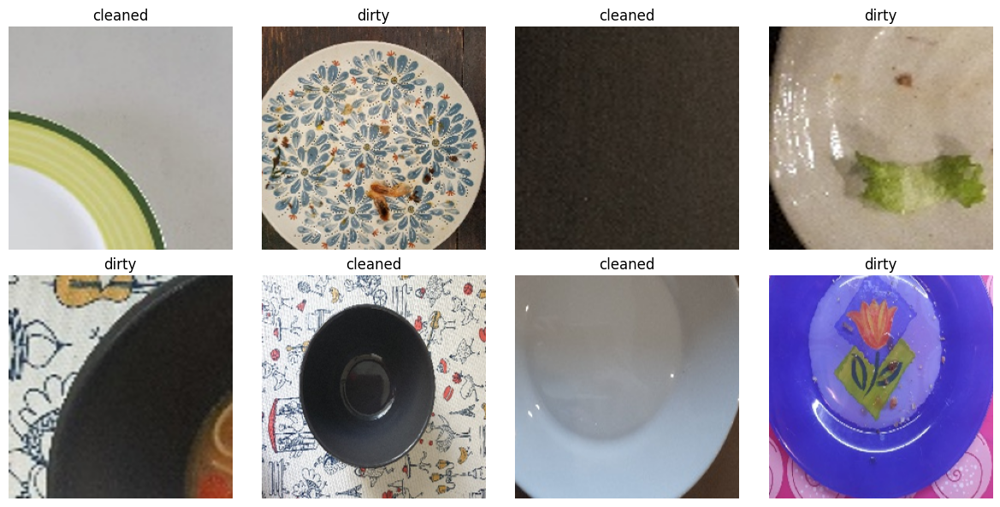

In [18]:
inputs, classes = next(iter(dataloaders['train']))
show_batch(inputs, titles=[class_names[x] for x in classes])

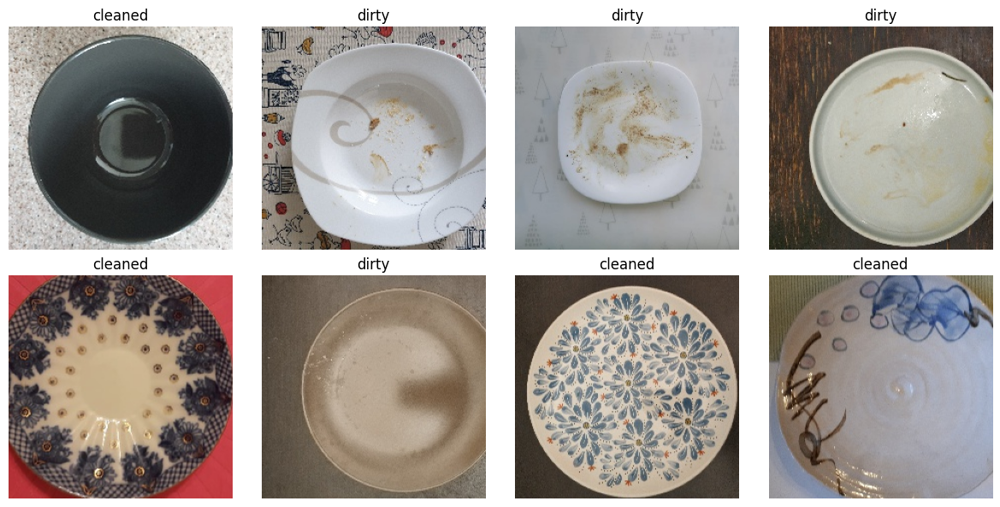

In [19]:
inputs, classes = next(iter(dataloaders['val']))
show_batch(inputs, titles=[class_names[x] for x in classes])

In [20]:
def train_loop(dataloader, feature_model, linear_classifier, loss_fn, optimizer):
    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    linear_classifier.train()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    running_loss = 0.0
    running_corrects = 0
    for batch, (X, y) in enumerate(dataloader):
        X = X.to(device)
        y = y.to(device)
        features = feature_model(X)
        # Compute prediction and loss
        pred = linear_classifier(features)
        loss = loss_fn(pred, y)

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        if torch.cuda.is_available():
            torch.cuda.synchronize()

        # Statistics
        running_loss += loss.item()
        running_corrects += (pred.argmax(1) == y).type(torch.float).sum().item()

    epoch_loss = running_loss / num_batches
    epoch_acc  = running_corrects / size
    return epoch_acc, epoch_loss

In [21]:
@torch.inference_mode()
def val_loop(dataloader, feature_model, linear_classifier, loss_fn):
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    linear_classifier.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    val_loss, val_acc = 0.0, 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for X, y in dataloader:
            X = X.to(device)
            y = y.to(device)   
            features = feature_model(X) 
            pred = linear_classifier(features)
            val_loss += loss_fn(pred, y).item()
            val_acc += (pred.argmax(1) == y).type(torch.float).sum().item()

    val_loss /= num_batches
    val_acc  /= size
    return val_acc, val_loss

In [22]:
loss_fn = nn.CrossEntropyLoss()
# optimizer = torch.optim.Adam(
#     linear_classifier.parameters(), 
#     lr=model_config['init_lr'], 
#     betas=(0.9, 0.999)
# )
optimizer = torch.optim.SGD(
    linear_classifier.parameters(),
    lr=model_config['init_lr'],
    momentum=0.9,
    weight_decay=0, # we do not apply weight decay
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, model_config['epochs'], eta_min=0)

# optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
best_acc = 0.0
best_acc_loss = np.inf
train_data = []
for t in range(model_config['epochs']):
    print(f'Epoch {t+1}\n-------------------------------')

    train_acc, train_loss = train_loop(dataloaders['train'], feature_model, linear_classifier, loss_fn, optimizer)
    # print(f'lr = {optimizer.param_groups[0]["lr"]}')
    train_data.append({
        'phase': 'train',
        'epoch': t,
        'lr': optimizer.param_groups[0]["lr"],
        'accuracy': train_acc,
        'loss': train_loss
    })
    scheduler.step()
    print(f'Train:\n  train_acc = {train_acc}, train_loss = {train_loss}')
    if t % VAL_FREQ == 0 or t == model_config['epochs'] - 1:
        val_acc, val_loss = val_loop(dataloaders['val'], feature_model, linear_classifier, loss_fn)
        train_data.append({
            'phase': 'val',
            'epoch': t,
            'lr': optimizer.param_groups[0]["lr"],
            'accuracy': val_acc,
            'loss': val_loss
        })
        print(f'Validation:\n    val_acc = {val_acc}, val_loss = {val_loss}')
        if (val_acc == best_acc and val_loss < best_acc_loss) or (val_acc > best_acc):
            best_acc, best_acc_loss = val_acc, val_loss
            print(f'Best accuracy = {best_acc}, best_loss = {best_acc_loss}')
            save_dict = {
                'epoch': t + 1,
                'state_dict': linear_classifier.state_dict(),
                'optimizer': optimizer.state_dict(),
                # 'scheduler': scheduler.state_dict(),
                'best_acc': best_acc,
                'best_loss': best_acc_loss
            }
            torch.save(save_dict, os.path.join(OUTPUT_DIR, 'dino_classifier_ckpt.pth'))

    print('\n')
print('Training completed.')



Epoch 1
-------------------------------
Train:
  train_acc = 0.46875, train_loss = 0.8128056973218918
Validation:
    val_acc = 0.625, val_loss = 0.6655426025390625
Best accuracy = 0.625, best_loss = 0.6655426025390625


Epoch 2
-------------------------------
Train:
  train_acc = 0.71875, train_loss = 0.5856724753975868
Validation:
    val_acc = 0.75, val_loss = 0.5593517422676086
Best accuracy = 0.75, best_loss = 0.5593517422676086


Epoch 3
-------------------------------
Train:
  train_acc = 0.8125, train_loss = 0.43741244077682495
Validation:
    val_acc = 0.875, val_loss = 0.4075925648212433
Best accuracy = 0.875, best_loss = 0.4075925648212433


Epoch 4
-------------------------------
Train:
  train_acc = 0.96875, train_loss = 0.32201751321554184
Validation:
    val_acc = 0.875, val_loss = 0.33995646238327026
Best accuracy = 0.875, best_loss = 0.33995646238327026


Epoch 5
-------------------------------
Train:
  train_acc = 1.0, train_loss = 0.22655317932367325
Validation:
    

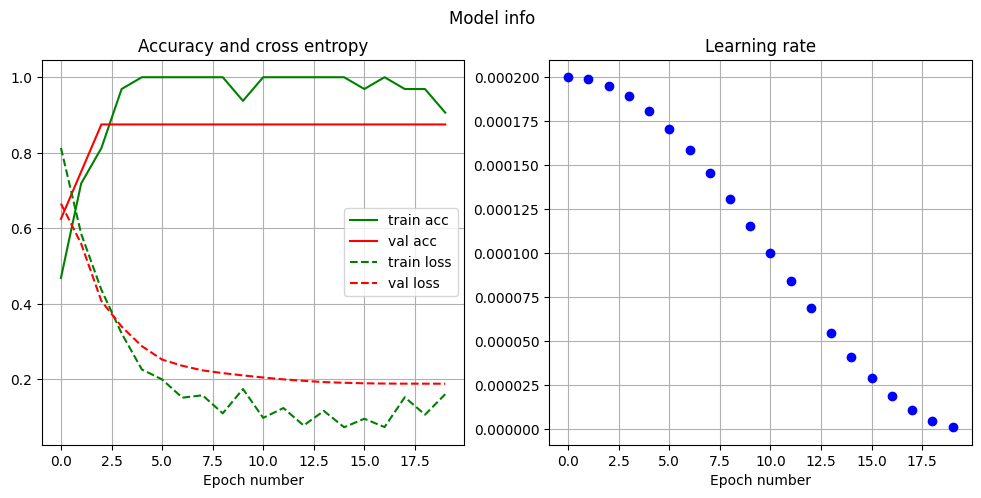

In [23]:
train_df = pd.DataFrame(train_data)
train_phase = train_df[train_df['phase'] == 'train']
val_phase   = train_df[train_df['phase'] == 'val']
y_axis = 'accuracy'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
line_acc_train, = ax1.plot(train_phase['epoch'], train_phase['accuracy'], 'g-', label='train acc')
line_acc_val, = ax1.plot(val_phase['epoch'], val_phase['accuracy'], 'r-', label='val acc')
line_loss_train, = ax1.plot(train_phase['epoch'], train_phase['loss'], 'g--', label='train loss')
line_loss_val, = ax1.plot(val_phase['epoch'], val_phase['loss'], 'r--', label='val loss')
ax1.set_xlabel('Epoch number')
ax1.legend(loc='center right')
ax1.set_title('Accuracy and cross entropy')
ax1.grid(visible=True)
line_lr = ax2.plot(train_phase['epoch'], train_phase['lr'], 'ob', label='learning rate')
ax2.set_xlabel('Epoch number')
ax2.set_title('Learning rate')
ax2.grid(visible=True)
fig.suptitle('Model info')
plt.show();

In [24]:
checkpoint = torch.load(os.path.join(OUTPUT_DIR, 'dino_classifier_ckpt.pth'))
epoch = checkpoint['epoch']
best_acc = checkpoint['best_acc']
best_loss = checkpoint['best_loss']
print(epoch, best_acc, best_loss)

20 0.875 0.1887827217578888


In [25]:
model_inf = LinearClassifier(embed_dim, model_config)
model_inf = model_inf.to(device)

model_inf.load_state_dict(checkpoint['state_dict'])
model_inf.eval()


LinearClassifier(
  (linear): Linear(in_features=2048, out_features=2, bias=True)
)

In [26]:
def visualize_model(feature_model, linear_classifier, images, rows=2, cols=4):
  was_training = linear_classifier.training
  linear_classifier.eval()

  with torch.no_grad():
    imgs = images.to(device)
    features = feature_model(imgs)
    outputs = linear_classifier(features)
    outputs = nn.functional.softmax(outputs, dim=1)
    prediction_score, pred_label_idx = torch.topk(outputs, 1)
    _, preds = torch.max(outputs, 1)
    # titles = [f'{class_names[pred_label_idx[i]]}: score {prediction_score[i].squeeze().item():.3f}' for i in range(imgs.size(0))]
    titles = [f'Clean:{outputs[i, 0].squeeze().item():.3f}; Dirty:{outputs[i, 1].squeeze().item():.3f}' for i in range(imgs.size(0))]
    show_batch(imgs, titles=titles)
    
  linear_classifier.train(mode=was_training)


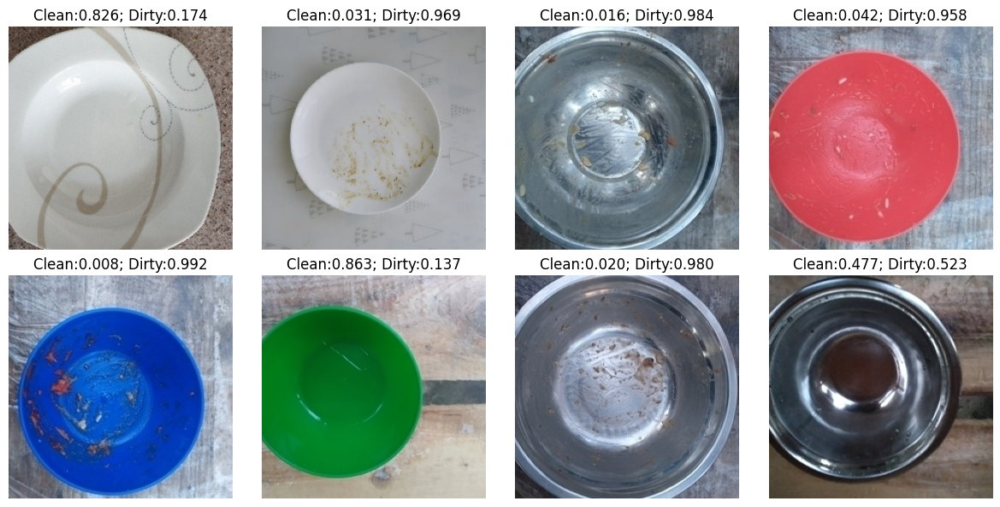

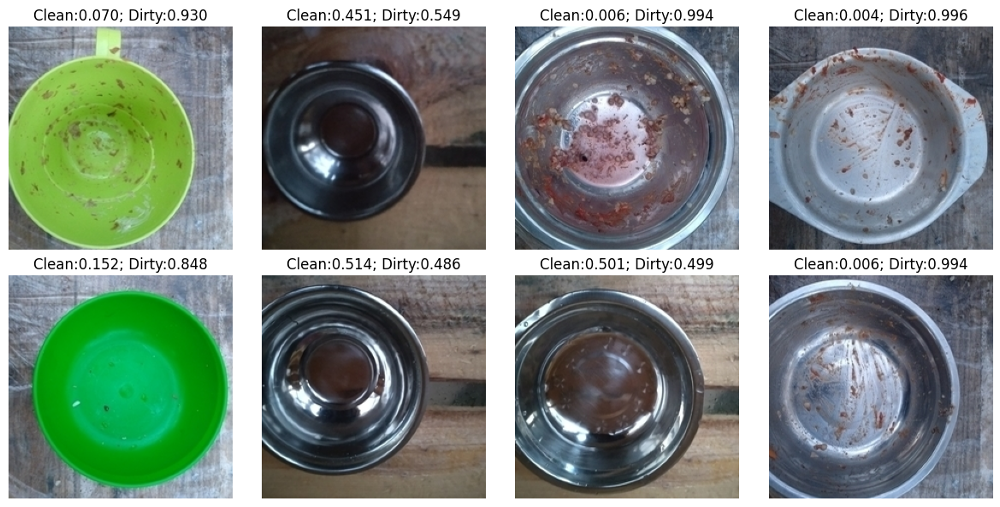

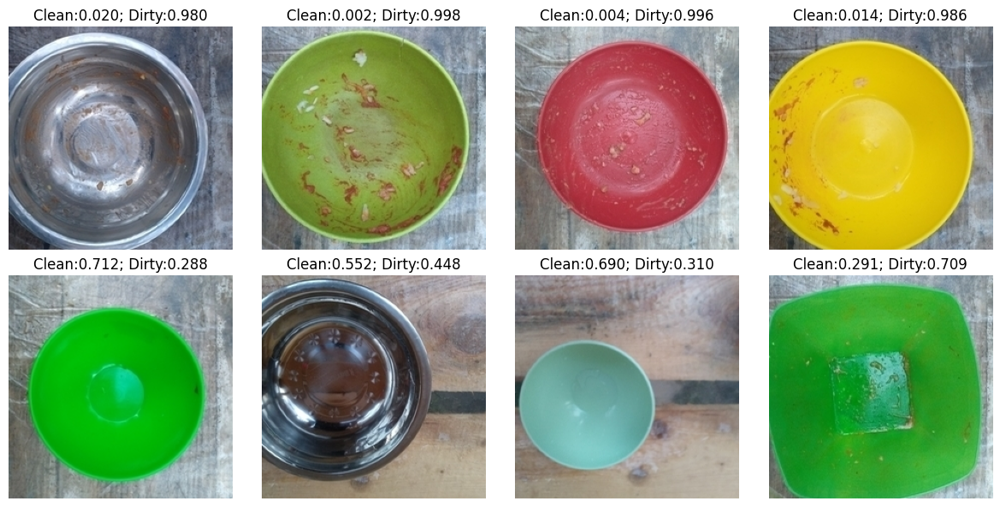

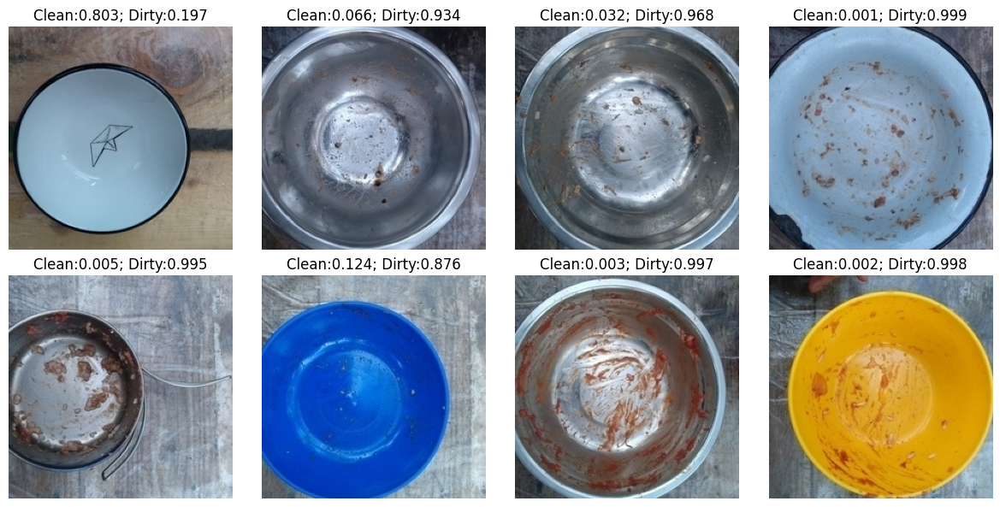

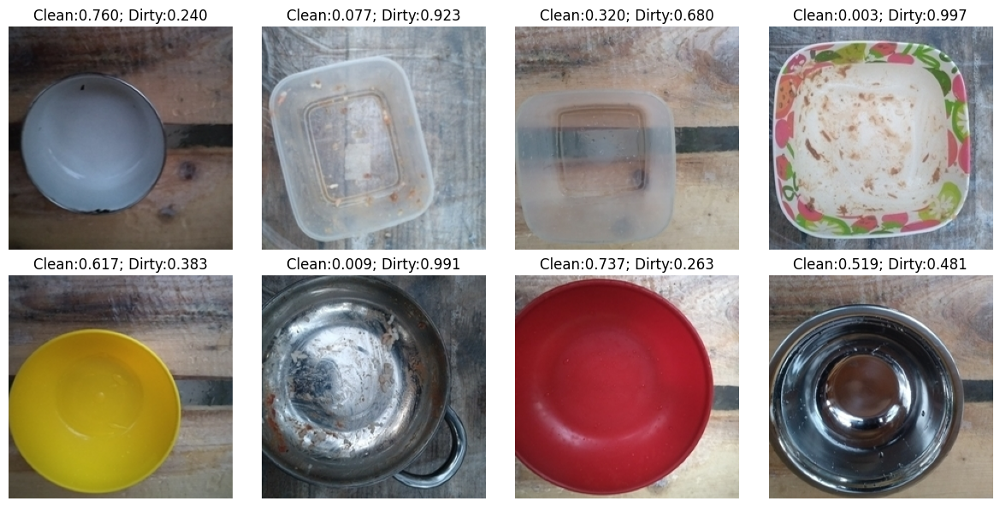

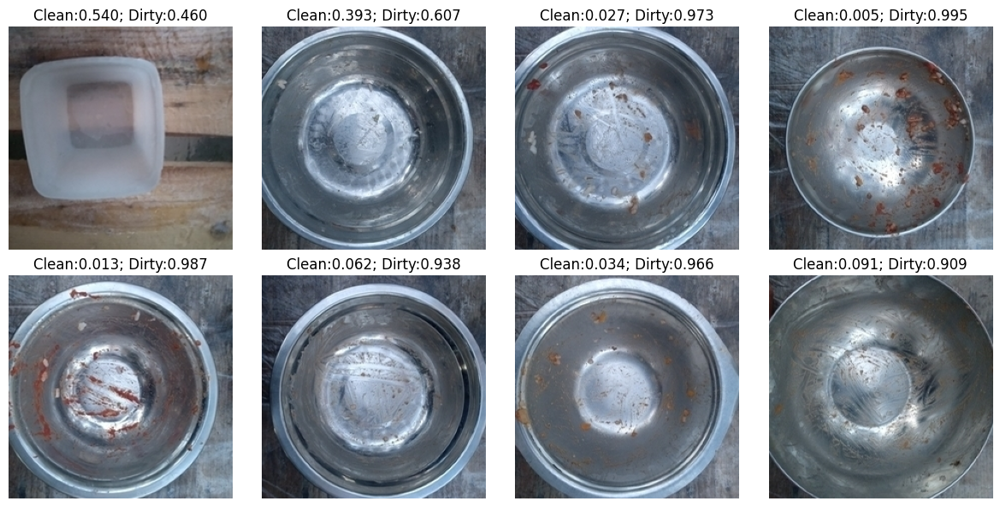

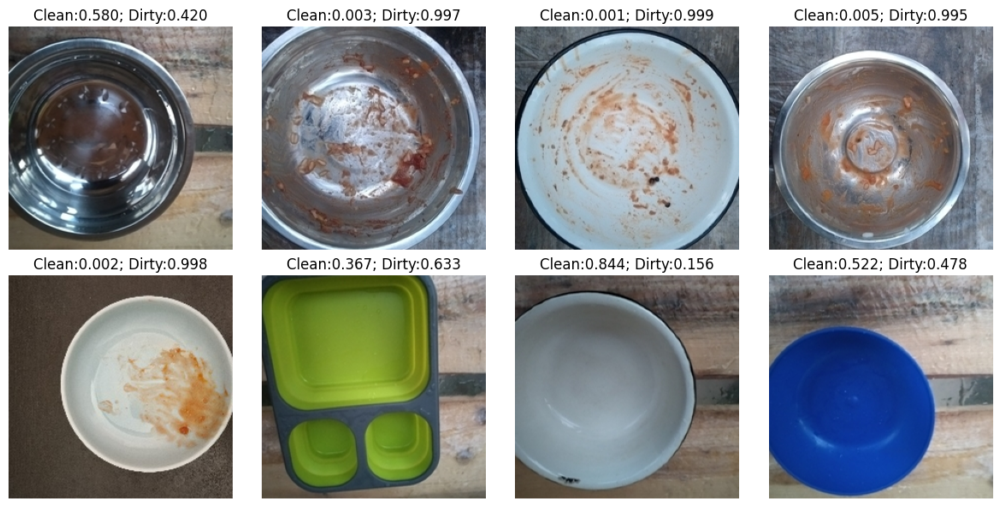

In [27]:
dl_iter = iter(dataloaders['test'])
for _ in range(7):
    imgs, _ = next(dl_iter)
    visualize_model(feature_model, model_inf, imgs)

In [28]:
test_predictions = []
test_img_paths = []
for inputs, paths in tqdm(dataloaders['test']):
    inputs = inputs.to(device)
    with torch.set_grad_enabled(False):
        features = feature_model(inputs)
        preds = model_inf(features)
    test_predictions.append(
        nn.functional.softmax(preds, dim=1)[:,0].data.cpu().numpy())   # was [;,1] 
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

100%|██████████| 93/93 [00:23<00:00,  3.98it/s]


In [29]:
test_predictions

array([8.25941682e-01, 3.12698707e-02, 1.59936417e-02, 4.18760963e-02,
       7.98238162e-03, 8.63288045e-01, 1.97341479e-02, 4.77222979e-01,
       6.95724487e-02, 4.50788796e-01, 6.06203126e-03, 4.00957745e-03,
       1.51556775e-01, 5.14273822e-01, 5.00604033e-01, 5.70412260e-03,
       2.03183945e-02, 1.88128138e-03, 4.39453917e-03, 1.38085987e-02,
       7.12023795e-01, 5.52041173e-01, 6.89564526e-01, 2.91064739e-01,
       8.02755177e-01, 6.58257008e-02, 3.18907611e-02, 1.02752261e-03,
       4.90604388e-03, 1.23898298e-01, 2.52348068e-03, 2.32093991e-03,
       7.59565115e-01, 7.68521279e-02, 3.20364296e-01, 2.74237478e-03,
       6.17038786e-01, 9.33019817e-03, 7.36937165e-01, 5.18958986e-01,
       5.39935172e-01, 3.93486679e-01, 2.74552163e-02, 4.67437366e-03,
       1.31632872e-02, 6.18848763e-02, 3.44962776e-02, 9.12389606e-02,
       5.80076993e-01, 3.49640870e-03, 9.42351588e-04, 4.57400130e-03,
       1.95303489e-03, 3.67038041e-01, 8.44076693e-01, 5.22438705e-01,
      

In [30]:
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'cleaned' if pred > 0.2 else 'dirty')
submission_df['id'] = submission_df['id'].str.replace('/kaggle/working/test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(8)

,label
id,
0727,cleaned
0729,dirty
0500,dirty
0142,dirty
0318,dirty
0164,cleaned
0651,dirty
0349,cleaned


In [31]:
submission_df.to_csv('submission.csv')

In [32]:
# !rm -rf train val test output plates


    @misc{platesv2,
        author = {Igor.Slinko},
        title = {Cleaned vs Dirty V2},
        publisher = {Kaggle},
        year = {2019},
        url = {https://kaggle.com/competitions/platesv2}
    }
